#**<center>AMAZON SALES DATA ANALYSIS</center>**

##**Importing Required Libraries:**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

## **Import dataset:**

In [2]:
sales_data=pd.read_excel("/content/SALESDATA.xlsx")

In [3]:
sales_data.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Order Number,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M
0,10000481.0,2017-04-30,-237.91,2017-04-30,100012.0,NaN,NaN,Urban Large Eggs,2000.0,0.00,200015.0,2017-04-30,237.91,0.00,0.0,237.91,237.910000,1.0,184.0,EA
1,10002220.0,2017-07-14,368.79,2017-07-14,100233.0,P01,20910.0,Moms Sliced Turkey,1000.0,824.96,200245.0,2017-07-14,456.17,824.96,0.0,456.17,456.170000,1.0,127.0,EA
2,10002220.0,2017-10-17,109.73,2017-10-17,116165.0,P01,38076.0,Cutting Edge Foot-Long Hot Dogs,1000.0,548.66,213157.0,2017-10-16,438.93,548.66,0.0,438.93,438.930000,1.0,127.0,EA
3,10002489.0,2017-06-03,-211.75,2017-06-03,100096.0,NaN,NaN,Kiwi Lox,1000.0,0.00,200107.0,2017-06-03,211.75,0.00,0.0,211.75,211.750000,1.0,160.0,EA
4,10004516.0,2017-05-27,96627.94,2017-05-27,103341.0,P01,60776.0,High Top Sweet Onion,1000.0,408.52,203785.0,2017-05-28,89248.66,185876.60,0.0,89248.66,196.150901,455.0,124.0,SE


In [4]:
#checking the shape
sales_data.shape

(65282, 20)

Observation:
we have 65282 records and 20 columns in the dataset.

In [5]:
# Let's see the columns name
sales_data.columns

Index(['CustKey', 'DateKey', 'Discount Amount', 'Invoice Date',
       'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
       'List Price', 'Order Number', 'Promised Delivery Date', 'Sales Amount',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep',
       'U/M'],
      dtype='object')

In [6]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  float64       
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  float64       
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  float64       
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

Observation:
In the information of the dataset we got to know the number of columns, columns name and the data type of the columns.

In [7]:
# Checking for any missing values
sales_data.isnull().sum()

CustKey                                0
DateKey                                0
Discount Amount                        2
Invoice Date                           0
Invoice Number                         0
Item Class                          8289
Item Number                           41
Item                                   0
Line Number                            0
List Price                             0
Order Number                           0
Promised Delivery Date                 0
Sales Amount                           0
Sales Amount Based on List Price       0
Sales Cost Amount                      0
Sales Margin Amount                    0
Sales Price                            1
Sales Quantity                         0
Sales Rep                              0
U/M                                    0
dtype: int64

Observation:
Here we got see that some of the columns having the missing values like Discount Amount has 2 missing values, Item class has 8289, Item Number has 41 and 1 in the sales price.

In [8]:
sales_data1 = sales_data.copy()

In [9]:
sales_data1['Item Class'].value_counts()

P01    56977
PO1       16
Name: Item Class, dtype: int64

In [10]:
#generating descriptive statistics
sales_data1.describe().round()

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
count,65282.0,65280.0,65282.0,65282.0,65282.0,65282.0,65282.0,65282.0,65282.0,65282.0,65281.0,65282.0,65282.0
mean,10017703.0,1856.0,216224.0,23714.0,515.0,180583.0,2852.0,4707.0,1661.0,1191.0,284.0,45.0,137.0
std,7176.0,9037.0,94992.0,32664.0,449.0,67594.0,15164.0,20696.0,9556.0,5861.0,253.0,430.0,27.0
min,10000453.0,-255821.0,100012.0,1000.0,0.0,100838.0,200.0,0.0,0.0,-3933.0,-5000.0,-1.0,103.0
25%,10012715.0,246.0,117931.0,3000.0,182.0,115321.0,308.0,561.0,168.0,130.0,100.0,2.0,113.0
50%,10019665.0,442.0,222870.0,12000.0,325.0,203702.0,554.0,998.0,304.0,246.0,184.0,3.0,134.0
75%,10023511.0,1000.0,314319.0,32000.0,804.0,218576.0,1280.0,2315.0,687.0,580.0,448.0,8.0,160.0
max,10027583.0,343533.0,332842.0,344000.0,2761.0,321532.0,555376.0,632610.0,366576.0,188800.0,6035.0,16000.0,185.0


In [11]:
# Creating Year, Month, Quarter, Day Columns in sales_data1
# Here I'm creating new columns with help of the Invoice Date columns, where
# it contain the yyyy/mm/dd formate

sales_data1['Invoice_Year'] = sales_data['Invoice Date'].dt.year
sales_data1['Invoice_Month'] = sales_data['Invoice Date'].dt.month
sales_data1['Invoice_Quarter'] = sales_data['Invoice Date'].dt.quarter
sales_data1['Invoice_Day'] = sales_data['Invoice Date'].dt.day

In [12]:
sales_data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 24 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  float64       
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  float64       
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  float64       
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

In [13]:
# Creating DataFrame only with necessary values. 
# Considering the data which is realted to sales.

sales_data2 = sales_data1[['CustKey', 'Item','Invoice Date','Invoice_Year','Invoice_Quarter','Invoice_Month','Invoice_Day',
                          'Sales Quantity','Sales Amount','Sales Amount Based on List Price','Discount Amount','Sales Margin Amount',
                          'Sales Cost Amount','Sales Rep','U/M','List Price','Sales Price']]

In [14]:
sales_data2.isnull().sum()

CustKey                             0
Item                                0
Invoice Date                        0
Invoice_Year                        0
Invoice_Quarter                     0
Invoice_Month                       0
Invoice_Day                         0
Sales Quantity                      0
Sales Amount                        0
Sales Amount Based on List Price    0
Discount Amount                     2
Sales Margin Amount                 0
Sales Cost Amount                   0
Sales Rep                           0
U/M                                 0
List Price                          0
Sales Price                         1
dtype: int64

In [15]:
# removing the null values from the columns.

sales_data2.dropna(subset=['Discount Amount','Sales Price'], axis=0,inplace= True)

/usr/local/lib/python3.8/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


In [16]:
sales_data2.isnull().sum()

CustKey                             0
Item                                0
Invoice Date                        0
Invoice_Year                        0
Invoice_Quarter                     0
Invoice_Month                       0
Invoice_Day                         0
Sales Quantity                      0
Sales Amount                        0
Sales Amount Based on List Price    0
Discount Amount                     0
Sales Margin Amount                 0
Sales Cost Amount                   0
Sales Rep                           0
U/M                                 0
List Price                          0
Sales Price                         0
dtype: int64

<AxesSubplot:>

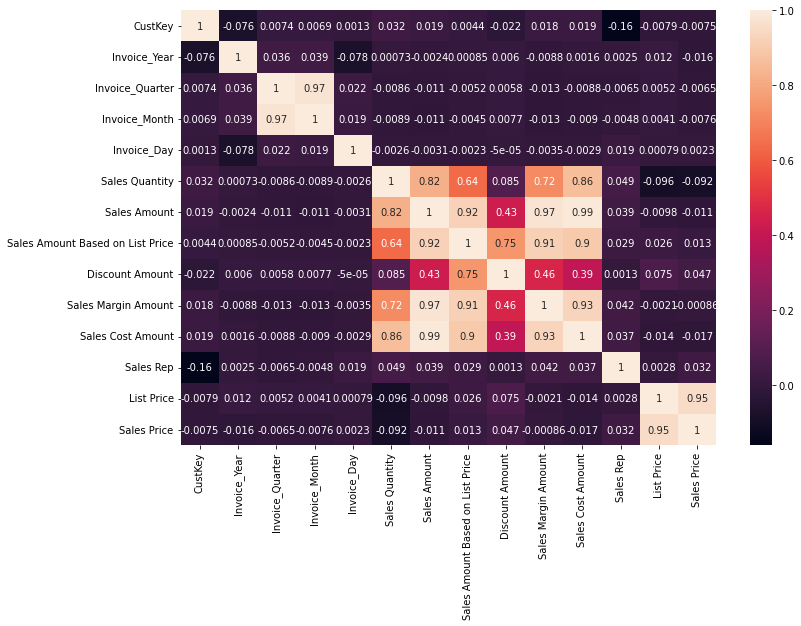

In [17]:
#Checking the correlation

plt.figure(figsize=(12,8))
sns.heatmap(sales_data2.corr(),annot=True)

Observations:

1- Discount Amount is highly related to Sales Amount, Sales Cost Amount, Sales Amount Based on List Price & Sales Margin Amount and moderately related to Sales Quantity.

2- List Price highly related to sales price and has no relations with Sales amount, Sales cost amount, Sales amount based on list price & sales margin amount.

3- Sales quantity is moderately related to Sales amount, discount amount, sales margin amount.

4- Their is no relation Between Sales Rep and Sales Amount, Sales Margin Amount.

In [18]:
sales_data2.head()

,CustKey,Item,Invoice Date,Invoice_Year,Invoice_Quarter,Invoice_Month,Invoice_Day,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,U/M,List Price,Sales Price
0,10000481.0,Urban Large Eggs,2017-04-30,2017,2,4,30,1.0,237.91,0.00,-237.91,237.91,0.0,184.0,EA,0.00,237.910000
1,10002220.0,Moms Sliced Turkey,2017-07-14,2017,3,7,14,1.0,456.17,824.96,368.79,456.17,0.0,127.0,EA,824.96,456.170000
2,10002220.0,Cutting Edge Foot-Long Hot Dogs,2017-10-17,2017,4,10,17,1.0,438.93,548.66,109.73,438.93,0.0,127.0,EA,548.66,438.930000
3,10002489.0,Kiwi Lox,2017-06-03,2017,2,6,3,1.0,211.75,0.00,-211.75,211.75,0.0,160.0,EA,0.00,211.750000
4,10004516.0,High Top Sweet Onion,2017-05-27,2017,2,5,27,455.0,89248.66,185876.60,96627.94,89248.66,0.0,124.0,SE,408.52,196.150901


In [19]:
sales_data2.shape

(65280, 17)

In [20]:
sales_data2.Item.value_counts()

Better Fancy Canned Sardines    1648
Ebony Prepared Salad            1471
Moms Sliced Turkey              1192
Imagine Popsicles               1191
Discover Manicotti              1126
                                ... 
Fast Salted Pretzels               1
Great Bagels                       1
Imagine Frozen Cauliflower         1
Jeffers Corn Puffs                 1
Bravo Fancy Canned Sardines        1
Name: Item, Length: 657, dtype: int64

Observation:
Highest number of sold Item is 'Better Fancy Canned Sardines'
Top 5 Items sold are:
1.Better Fancy Canned Sardines    1648
2.Ebony Prepared Salad            1471
3.Moms Sliced Turkey              1192
4.Imagine Popsicles               1191
5.Discover Manicotti              1126

In [21]:
sales_data2.describe()

,CustKey,Invoice_Year,Invoice_Quarter,Invoice_Month,Invoice_Day,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,6.528000e+04,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000
mean,1.001770e+07,2017.960907,2.414246,6.307001,16.155898,45.085708,2852.043002,4707.617837,1855.574835,1191.012887,1661.030116,137.423192,514.709149,283.696851
std,7.176244e+03,0.946607,1.160954,3.563558,8.795338,429.668301,15164.569043,20696.744425,9037.140888,5860.857507,9556.627220,26.643926,449.187029,252.031660
min,1.000045e+07,2017.000000,1.000000,1.000000,1.000000,1.000000,200.010000,0.000000,-255820.800000,-3932.930000,0.000000,103.000000,0.000000,0.337341
25%,1.001272e+07,2017.000000,1.000000,3.000000,9.000000,2.000000,308.380000,561.040000,246.037500,129.947500,167.790000,113.000000,181.560000,100.070000
50%,1.001966e+07,2018.000000,2.000000,6.000000,16.000000,3.000000,553.940000,998.160000,441.760000,246.490000,304.530000,134.000000,325.190000,183.758250
75%,1.002351e+07,2019.000000,3.000000,9.000000,24.000000,8.000000,1279.987500,2316.630000,999.760000,579.390000,687.400000,160.000000,803.860000,448.220000
max,1.002758e+07,2019.000000,4.000000,12.000000,31.000000,16000.000000,555376.000000,632610.160000,343532.660000,188800.000000,366576.000000,185.000000,2760.700000,6035.000000


In [22]:
from pandas_profiling import ProfileReport

<ipython-input-22-e2a33329b6f0>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [23]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.1 MB)
  Preparing metadata (setup.py) ... done


In [24]:
profile = ProfileReport(sales_data2,explorative=True, dark_mode=True)

In [25]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
profile.to_file('output.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
!pip install dtale

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 35.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.9/45.9 KB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 62.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.7/219.7 KB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 51.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 KB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 642.7/642.7 KB 43.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 94.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.0/300.0 KB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

In [28]:
import dtale 
dtale.show(sales_data2)

http://83b1f7ecd770:40000/dtale/main/1

In [29]:
sales_data2[[ 'List Price','Sales Price','Sales Amount Based on List Price','Sales Amount','Discount Amount']].head(16)

,List Price,Sales Price,Sales Amount Based on List Price,Sales Amount,Discount Amount
0,0.0000,237.910000,0.0000,237.91,-237.9100
1,824.9600,456.170000,824.9600,456.17,368.7900
2,548.6600,438.930000,548.6600,438.93,109.7300
3,0.0000,211.750000,0.0000,211.75,-211.7500
4,408.5200,196.150901,185876.6000,89248.66,96627.9400
5,0.0000,1950.000000,0.0000,1950.00,-1950.0000
6,795.3140,424.300000,795.3140,424.30,371.0140
7,575.0000,270.960000,1150.0000,541.92,608.0800
8,51.8800,23.560000,778.2000,353.40,424.8000
9,412.0300,187.150000,24721.8000,11229.00,13492.8000


Observation:
Discount Amount = (Sales Amount Based on List Price - Sales Amount)

In [30]:
sales_data2.to_excel('raw_data.xls', index=False)

<ipython-input-30-fbe8ff51cced>:1: FutureWarning:

As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.



Yearly Sales Record:

In [31]:
Yearly_Sales =  sales_data2[['CustKey','Item','Invoice Date','Invoice_Year','Invoice_Month',
                            'Sales Quantity', 'Sales Amount Based on List Price','Discount Amount',
                           'Sales Amount', 'Sales Margin Amount','Sales Cost Amount','Sales Rep','U/M','List Price',
                           'Sales Price']]

,Invoice_Year,Sales Amount
0,2017,87457304.54
1,2018,20817471.00
2,2019,77906591.65


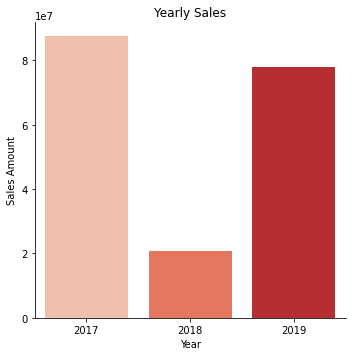

In [32]:
Yearly_Sales01 = Yearly_Sales.groupby('Invoice_Year').sum().reset_index()
sns.catplot(y = 'Sales Amount', x = 'Invoice_Year', data = Yearly_Sales01, palette='Reds',kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Amount')
plt.title('Yearly Sales')
Yearly_Sales01[['Invoice_Year', 'Sales Amount']]

<AxesSubplot:xlabel='Invoice_Month', ylabel='Sales Amount'>

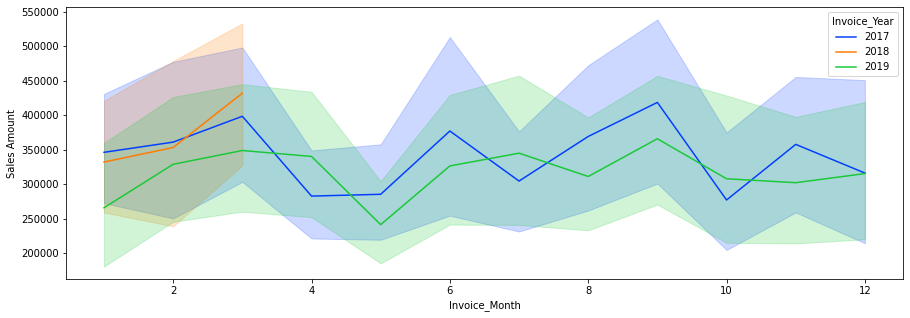

In [33]:
plt.figure(figsize = (15,5))
sns.lineplot(y ='Sales Amount', x = 'Invoice_Month',
             data= sales_data2.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='bright')

Obseravtions:
From this plot, it is clear that Sales decreased continuously & then it started to increase from 2018 to 2019.

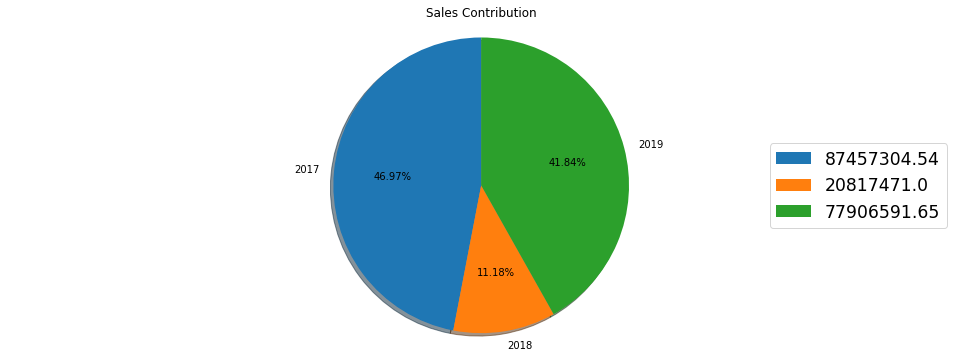

In [34]:
#Plotting Piechart to know Sales Share among 3 years
plt.figure(figsize=(17,6))
plt.pie('Sales Amount',labels='Invoice_Year',data=Yearly_Sales01,
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Sales Contribution')
plt.legend(round(Yearly_Sales01['Sales Amount'],2), loc=7, fontsize = 'xx-large')
plt.show()

Observations:
From 2017-19 Highest Sales Amount 2017>2019>2018.

Text(0, 0.5, 'Count')

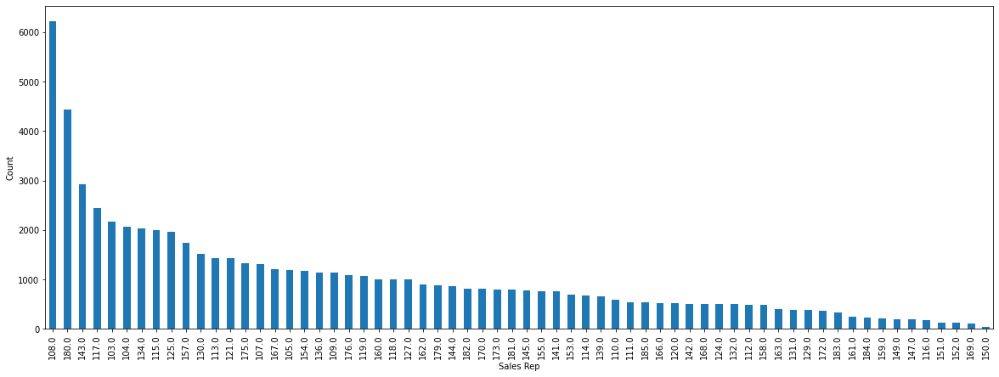

In [35]:
plt.figure(figsize=(20, 7))
sales_data2['Sales Rep'].value_counts().plot.bar()
plt.xlabel('Sales Rep')
plt.ylabel('Count')

Sales Rep "108" were used most often while sales rep "150" has been used the least.

Yearly-Monthwise Records:

In [36]:
Yearly_Monthwise_Sales = sales_data2.groupby(['Invoice_Year','Invoice_Month']).sum().reset_index()
Yearly_Monthwise_Sales.iloc[:,6:].describe()

,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,27.000000,2.700000e+01,27.000000
mean,6.895606e+06,1.138197e+07,4.486368e+06,2.879604e+06,4.016002e+06,332258.740741,1.244452e+06,685915.941546
std,1.143812e+06,2.220965e+06,1.231585e+06,5.152791e+05,6.506092e+05,55396.534583,2.116445e+05,117490.201952
min,3.187481e+06,4.900167e+06,1.712686e+06,1.290189e+06,1.897292e+06,130314.000000,5.042254e+05,270807.438237
25%,6.461181e+06,1.077866e+07,4.024413e+06,2.622197e+06,3.688586e+06,306638.500000,1.143268e+06,620357.646119
50%,6.895858e+06,1.152212e+07,4.797025e+06,2.882060e+06,4.092856e+06,339909.000000,1.259842e+06,696506.820155
75%,7.600667e+06,1.278649e+07,5.277200e+06,3.134162e+06,4.370919e+06,366618.000000,1.365313e+06,753245.775603
max,8.786342e+06,1.472000e+07,6.112159e+06,3.810222e+06,5.041842e+06,404709.000000,1.558636e+06,876228.847969


**************************************************Yearly-Monthwise Sales Trend**************************************************


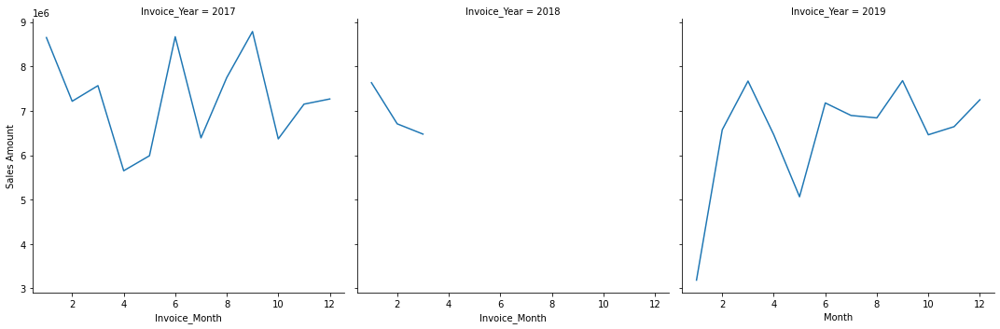

In [37]:
sns.relplot(x ='Invoice_Month',y = 'Sales Amount', data=Yearly_Monthwise_Sales,height=5,
            kind = 'line', aspect = 1, col = 'Invoice_Year')
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*50+'Yearly-Monthwise Sales Trend'+'*'*50)

<AxesSubplot:xlabel='Sales Amount', ylabel='Count'>

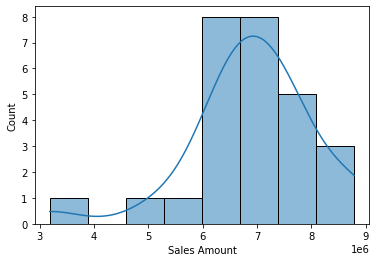

In [38]:
sns.histplot(Yearly_Monthwise_Sales['Sales Amount'], kde = True)

Monthly Records:

In [39]:
Monthly_sales = sales_data2.groupby(['Invoice_Year','Invoice_Month', 'Invoice_Day']).sum().reset_index()
Monthly_sales.iloc[:,5:].describe()

,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,559.000000,5.590000e+02,5.590000e+02,5.590000e+02,559.000000,559.000000,559.000000,559.000000,559.000000
mean,5265.107335,3.330615e+05,5.497554e+05,2.166940e+05,139086.442308,193975.037460,16048.275492,60107.716035,33130.108089
std,4781.445858,2.302024e+05,3.889088e+05,1.820144e+05,97025.174636,136009.114595,8052.820326,31837.127941,17179.276121
min,4.000000,5.433650e+03,0.000000e+00,-2.555238e+05,2349.360000,0.000000,345.000000,0.000000,1063.117667
25%,2106.500000,1.572531e+05,2.560595e+05,8.888978e+04,62655.095000,92237.325000,10063.000000,40370.544400,22084.687514
50%,3118.000000,2.688299e+05,4.487250e+05,1.630951e+05,113446.860000,150428.990000,14666.000000,54665.030000,30440.440019
75%,6577.000000,4.696801e+05,7.178838e+05,2.891977e+05,195474.320000,267013.720000,19652.500000,72573.307400,41211.201040
max,23710.000000,1.379283e+06,2.408920e+06,1.029636e+06,619085.330000,760197.860000,55866.000000,231196.720800,128415.923388


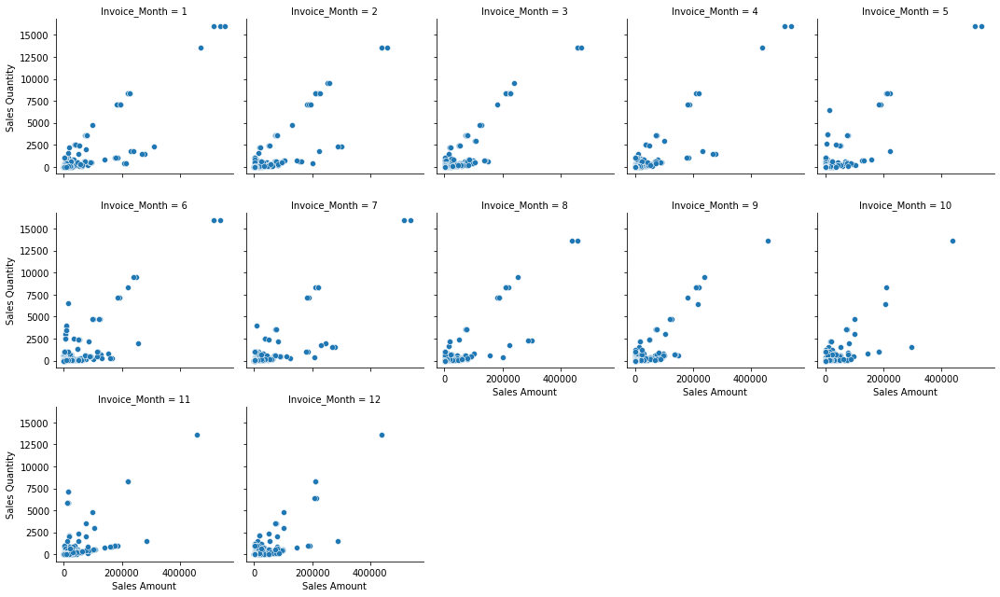

In [40]:
sns.relplot(y ='Sales Quantity',x = 'Sales Amount', data=sales_data2,height = 3,aspect=1,
            col = 'Invoice_Month',col_wrap=5, palette='muted')

**************************************************Monthly Sales Trend in 2017**************************************************


<Figure size 576x1440 with 0 Axes>

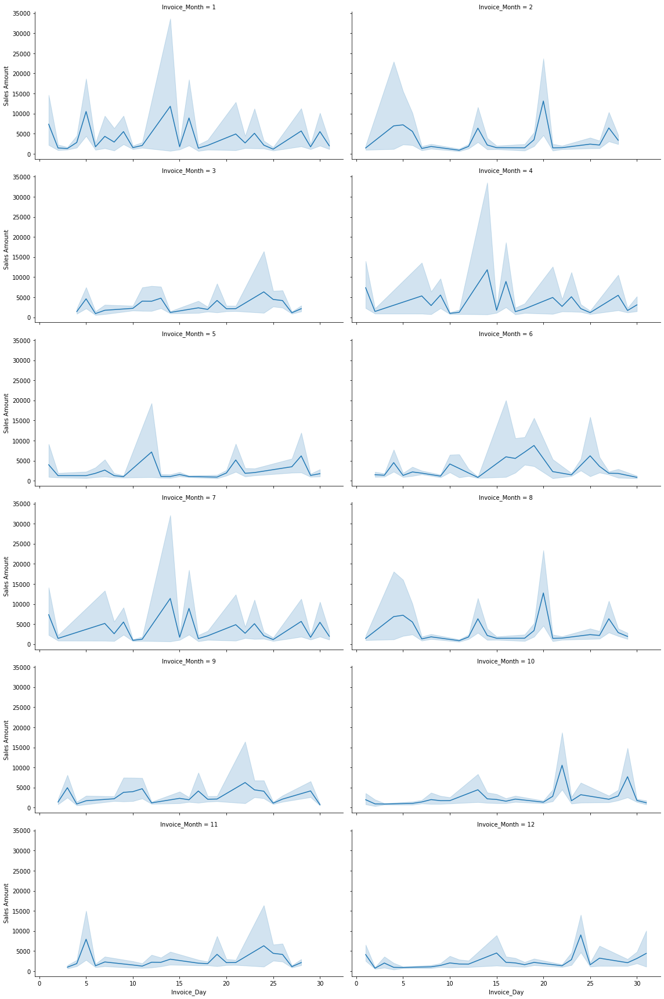

In [41]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2017'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2017'+'*'*50)

**************************************************Monthly Sales Trend in 2018**************************************************


<Figure size 576x1440 with 0 Axes>

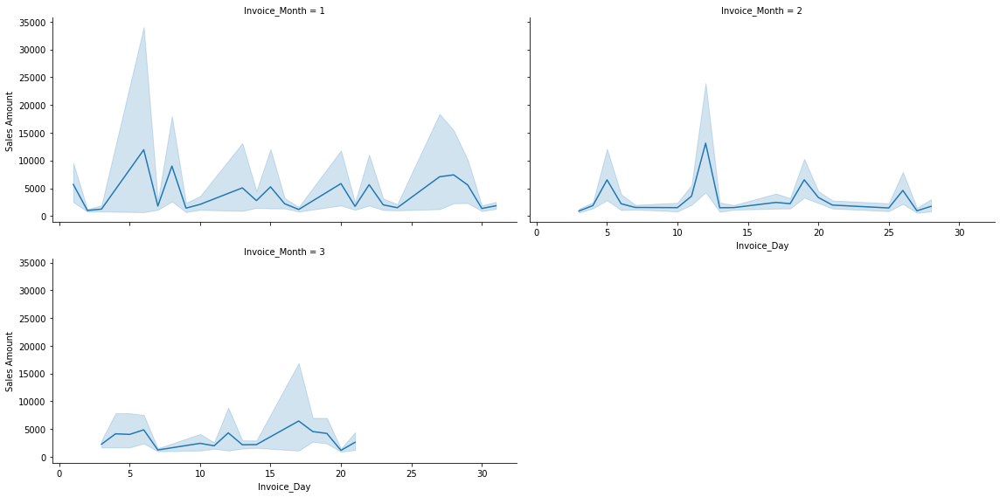

In [42]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2018'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2018'+'*'*50)

**************************************************Monthly Sales Trend in 2019**************************************************


<Figure size 576x1440 with 0 Axes>

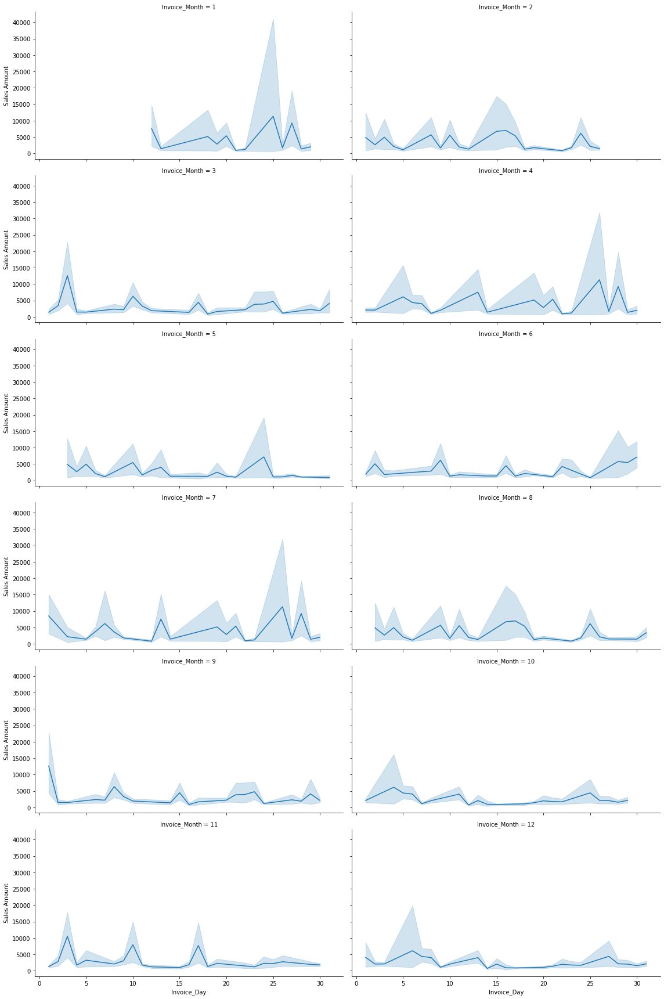

In [43]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2019'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2019'+'*'*50)

Profit Records:

,Invoice_Year,Sales Margin Amount
0,2017,37419472.46
1,2018,9147547.74
2,2019,31182301.05


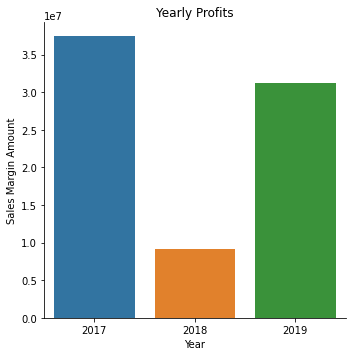

In [44]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Year', data = Yearly_Sales01,kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Margin Amount')
plt.title('Yearly Profits')
Yearly_Sales01[['Invoice_Year', 'Sales Margin Amount']]

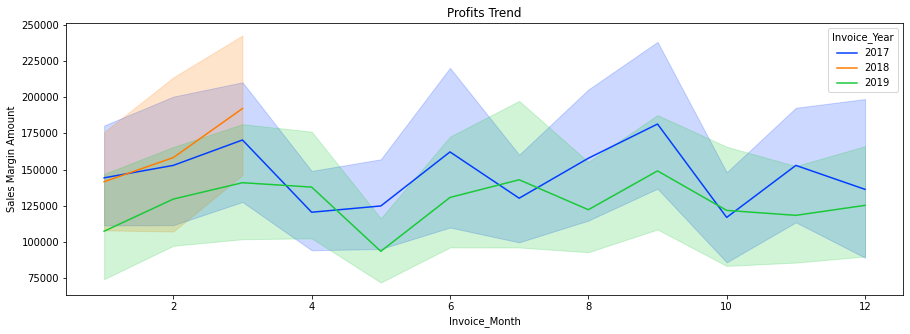

In [45]:
plt.figure(figsize = (15,5))
sns.lineplot(y ='Sales Margin Amount', x = 'Invoice_Month',
             data= sales_data2.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='bright')
plt.title('Profits Trend')
plt.show()

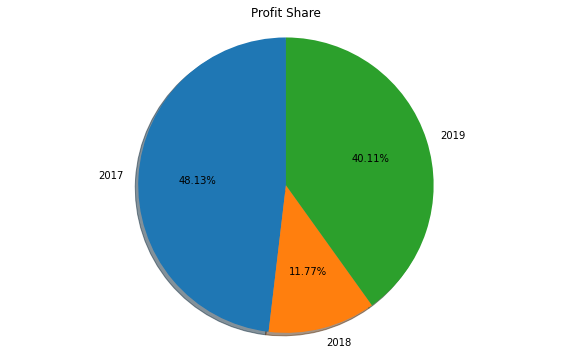

In [46]:
plt.figure(figsize=(10,6))
plt.pie('Sales Margin Amount',labels='Invoice_Year',data=Yearly_Sales01[['Invoice_Year', 'Sales Margin Amount']],
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Profit Share')
plt.show()

Top 10 Records:

In [47]:
Top10byCustKey17 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2017].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey17 = Top10byCustKey17.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

,CustKey,Sales Margin Amount
0,10021485.0,5176926.16
1,10025024.0,3250809.87
2,10025052.0,1761731.21
3,10025919.0,1415771.68
4,10025241.0,1267256.40
5,10023023.0,870216.36
6,10020184.0,843138.90
7,10009606.0,835041.55
8,10012715.0,782863.50
9,10023715.0,729615.06


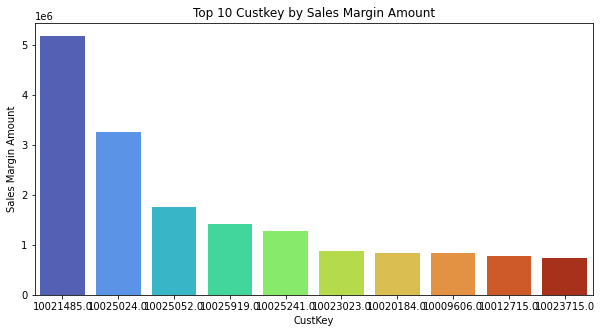

In [48]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey17, palette = 'turbo',
            order = Top10byCustKey17.CustKey)
plt.title('Top 10 Custkey by Sales Margin Amount')
Top10byCustKey17[['CustKey', 'Sales Margin Amount']]

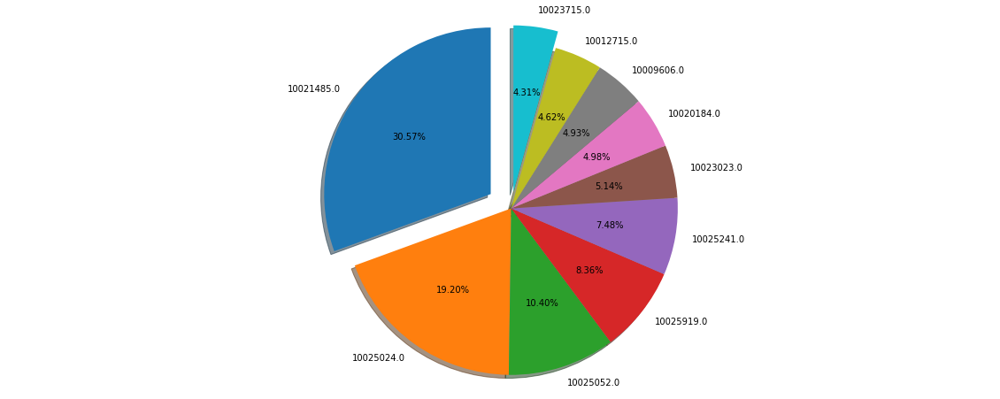

In [49]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey17,
        autopct='%1.2f%%',shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.show()

Observations:
Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10021485 contributed around 30.57% of the Sales Margin Amount in 2017.

In [50]:
Top10byCustKey18 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2018].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey18 = Top10byCustKey18.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

,CustKey,Sales Margin Amount
0,10025039.0,1398188.29
1,10002154.0,1154085.14
2,10006919.0,509760.00
3,10025552.0,332110.69
4,10017638.0,233470.15
5,10019066.0,207997.56
6,10026299.0,195547.06
7,10023471.0,195034.39
8,10007183.0,162898.91
9,10010935.0,152253.65


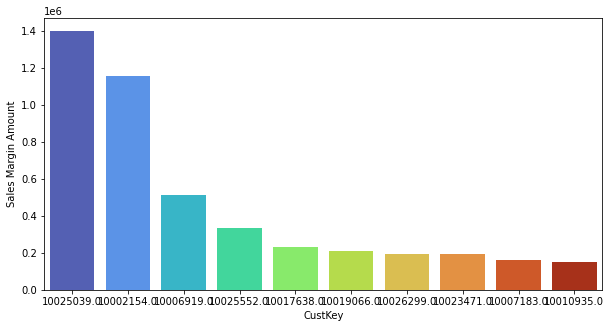

In [51]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey18, palette = 'turbo',
            order = Top10byCustKey18.CustKey)
Top10byCustKey18[['CustKey', 'Sales Margin Amount']]

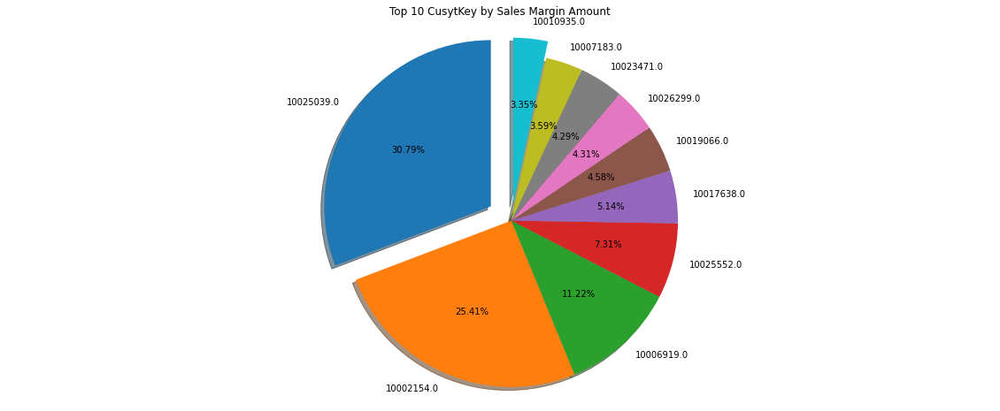

In [52]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey18,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 CusytKey by Sales Margin Amount')
plt.show()

Observations:
Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10025039 contributed around 30.79% of the Sales Margin Amount in 2018.

In [53]:
Top10byCustKey19 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2019].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey19 = Top10byCustKey19.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

,CustKey,Sales Margin Amount
0,10009676.0,4473954.12
1,10021300.0,2840289.66
2,10025737.0,1544679.20
3,10019194.0,1221320.93
4,10025353.0,1114700.90
5,10025571.0,798919.82
6,10026606.0,712503.86
7,10012226.0,702720.45
8,10016548.0,683579.49
9,10004245.0,619735.78


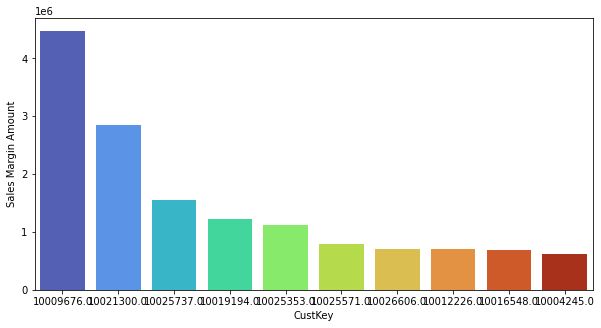

In [54]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey19, palette = 'turbo',
            order = Top10byCustKey19.CustKey)
Top10byCustKey19[['CustKey', 'Sales Margin Amount']]

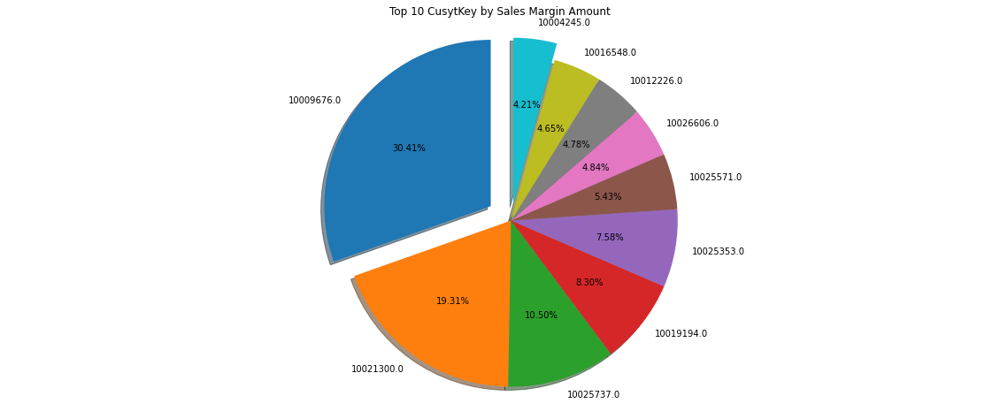

In [55]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey19,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 CusytKey by Sales Margin Amount')
plt.show()

Observations:
Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10009676 contributed around 30.41% of the Sales Margin Amount in 2019.